## ANLY-590 Assignment #1
### Anderson Monken
### September 13, 2020

### Question 1: LASSO and Ridge regressions

In [3]:
# libraries
import pandas as pd
import pandas_profiling
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn import linear_model
from itertools import cycle
import colorbrewer

In [70]:
# read in data and see data
df_raw = pd.read_csv("Hitters.csv")
df_raw.dtypes
profile = pandas_profiling.ProfileReport(df_raw, title='Pandas Profiling Report', explorative=True)
profile.to_notebook_iframe()

There are a few variables that are highly correlated. This is not ideal for linear regression. This could mean feature selection might not necessarily pick the correct variable of a highly correlated pair when $\alpha$ is increased.

In [4]:
# fix unnamed column
df = df_raw.rename(columns = {'Unnamed: 0' : 'player_name'})

# drop observations without salary information
df = df[~pd.isna(df['Salary'])]

In [5]:
# data for modeling
df_model = df.drop(columns = ['player_name', 'Division','League','NewLeague'])

# number of missings left
df_model.isna().sum()

# make new variables for modeling
X = df_model.drop(columns = ['Salary'])
y = df_model['Salary']

#### Problem 1.1

In [6]:
# run lasso regression for coefficient trajectories
alpha_array = np.logspace(0.01, 6, num=100)
alphas_lasso, coefs_lasso, _ = linear_model.lasso_path(X, y, 
                                                       alphas = alpha_array,
                                          max_iter = 100000, normalize = False, 
                                 random_state = 1351351, fit_intercept = True)

(-6.2995, 0.28950000000000004, -2.7417082273100246, 8.612968223619546)

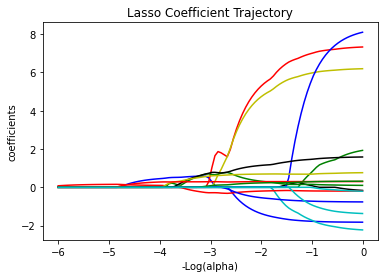

In [7]:
plt.figure()
colors = cycle(['b', 'r', 'g', 'c', 'k','y'])
neg_log_alphas_lasso = -np.log10(alphas_lasso)
for coef_l, c in zip(coefs_lasso, colors):
    l1 = plt.plot(neg_log_alphas_lasso, coef_l, c=c)

plt.xlabel('-Log(alpha)')
plt.ylabel('coefficients')
plt.title('Lasso Coefficient Trajectory')
plt.axis('tight')

In [8]:
# 20th entry (-log(alpha) ~ -4.8) is where there are only 3 variables remaining
list(X.columns[list(coefs_lasso[:,20] > 0)])

['AtBat', 'CAtBat', 'PutOuts']

The final three variables that remain in the model are at bats, career at bats, and put outs. Each variable speaks to a different asepct of the player's worth, their current batting success, their current defensive success, and their accumulated batting success.

In [58]:
# run lasso regression CV to find best alpha
lasso_reg = linear_model.LassoCV(alphas = alpha_array, cv = 5, 
                                 fit_intercept = True, 
                                 max_iter = 10000, normalize = False, 
                                 random_state = 1351351, n_jobs = 23)
lasso_results = lasso_reg.fit(X, y)

(0.5134521775029666, 1992966.5061647184, 40191.965175746256, 345225.7081486079)

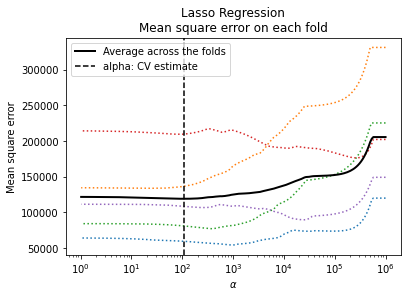

In [59]:
plt.figure()
plt.semilogx(lasso_reg.alphas_, lasso_reg.mse_path_, ':')
plt.plot(lasso_reg.alphas_, lasso_reg.mse_path_.mean(axis=-1), 'k',
         label='Average across the folds', linewidth=2)
plt.axvline(lasso_reg.alpha_, linestyle='--', color='k',
            label='alpha: CV estimate')

plt.legend()

plt.xlabel(r'$\alpha$')
plt.ylabel('Mean square error')
plt.title('Lasso Regression\nMean square error on each fold')
plt.axis('tight')

In [69]:
print(f'Lowest regularization penalty={round(lasso_reg.alpha_,2)}')

Lowest regularization penalty=106.35


In [64]:
print(f'There are {sum(lasso_results.coef_ != 0)} variables left in the model when the alpha is set to {round(lasso_reg.alpha_,2)}')

There are 10 variables left in the model when the alpha is set to 106.35


#### Problem 1.2: Repeat the analysis for Ridge regression


In [65]:
# run ridge regression for coefficient trajectories
alpha_array = np.logspace(0.01, 6, num=200)

coefs = []
for a in alpha_array:
    ridge = linear_model.Ridge(alpha=a, fit_intercept=False)
    ridge.fit(X, y)
    coefs.append(ridge.coef_)

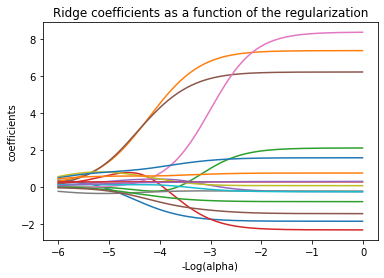

In [66]:
ax = plt.gca()

ax.plot(-np.log10(alpha_array), coefs)
#ax.set_xscale('log')
#ax.set_xlim(ax.get_xlim()[::-1])  # reverse axis
plt.xlabel('-Log(alpha)')
plt.ylabel('coefficients')
plt.title('Ridge coefficients as a function of the regularization')
plt.axis('tight')
plt.show()

In [67]:
# run ridge regression CV to find best alpha
ridge_reg = linear_model.RidgeCV(alphas = alpha_array, cv = 5, 
                                 fit_intercept = True,
                                 normalize = False)
ridge_results = ridge_reg.fit(X, y)

In [68]:
print(f'Optimal value of L2 regularization penalty {round(ridge_results.alpha_,2)}')

Optimal value of L2 regularization penalty 15630.39


### Question 2: Explain bias-variance tradeoff and role of regularization, using finding from Q1.

The bias-variance tradeoff is the choice between reducing bias in your model by making your model more flexible, or reducing the variance of the model results across samples by making the model less flexible. When a model is given more parameters to tune, the model can fit more complex situations, reducing bias in the test result to a point, but the variance of the results are likely to go up. Sometimes parsimonious models are preferred, and there is a desire to trade a little more bias in the model estimate for less variance in the model. 

In the LASSO model, the L1 regularization penalty performs feature selection. The $\alpha$ value hyperparameter allows for tuning of the balance between bias and variance. By increasing $\alpha$ the model is restricted to fewer variables, likely causing higher model bias and lower variance.

In problem 1.1, the cross-validated optimal regularization penalty is $\alpha$ $\approx$ 100, which will result in a model with 10 variables, having dropped 6 from the regression. This will reduce bias in the model the most. If there was a desire to lower variance, one could opt for an $\alpha$ $\approx$ 4500, reducing variables to only 5 while only adding 10% to the bias of the cross-validated result. 